In [149]:
import geopandas as gpd
import tobler
import pandas as pd
import numpy as np
import pooch

In [3]:
data_folder = "/Users/martin/Library/CloudStorage/OneDrive-SharedLibraries-TheAlanTuringInstitute/Daniel Arribas-Bel - demoland_data"

In [4]:
oa = gpd.read_file("https://borders.ukdataservice.ac.uk/ukborders/easy_download/prebuilt/shape/infuse_oa_lyr_2011_clipped.zip")

In [150]:
oa_centroids = gpd.read_file(f"{data_folder}/processed/OA_centroids_TyneWear.gpkg")

In [151]:
oa_centroids

,OBJECTID,OA11CD,GlobalID,geometry
0,126926,E00041377,c03c9813-26f3-41f9-85e5-d4cdf3742ca0,POINT (425583.000 562952.000)
1,126927,E00041435,16e6607e-0b59-4f6f-8ec6-06a7396a70a5,POINT (427216.699 555732.531)
2,126928,E00041745,4b5fa995-b251-4ee7-9a97-aef0a2598fe3,POINT (427897.004 559557.605)
3,126929,E00041432,6e660884-3917-4e46-a693-bad0821318cb,POINT (427856.367 555759.595)
4,126930,E00041742,0bfb7f06-a910-4fa2-8db1-e79d319ba232,POINT (427932.556 559770.754)
...,...,...,...,...
3790,130716,E00044203,2200a76a-aa0b-4f38-9717-648fbe9f41c6,POINT (438151.816 556849.853)
3791,130717,E00044893,b7ab57e6-0c67-42a5-87bb-a8f8e2444d52,POINT (435186.120 559616.831)
3792,130718,E00044693,107a6c5f-26d2-4708-bcf9-100c2d458f2b,POINT (432441.961 553073.663)
3793,130719,E00044993,a4fe264e-d756-4355-b3a1-67f603af5da8,POINT (429685.970 555978.643)


In [5]:
aoi = gpd.read_file(f"{data_folder}/processed/authorities/LADs_TyneWear.shp")

In [153]:
oa

,geo_code,geometry
0,E00145643,"POLYGON ((451260.982 209825.784, 451256.750 20..."
1,E00040642,"POLYGON ((443891.853 384189.461, 443880.000 38..."
2,E00040643,"POLYGON ((444099.378 383884.327, 444096.606 38..."
3,E00040640,"POLYGON ((443361.802 380854.567, 443361.935 38..."
4,E00040648,"POLYGON ((443404.096 383455.011, 443397.992 38..."
...,...,...
232291,E00040646,"POLYGON ((444046.883 383713.555, 444052.815 38..."
232292,E00040647,"POLYGON ((441708.046 383593.357, 441712.913 38..."
232293,E00040641,"POLYGON ((444260.282 380450.176, 444240.975 38..."
232294,E00040644,"POLYGON ((444099.378 383884.327, 444095.917 38..."


In [157]:
oa_aoi = oa[oa.geo_code.isin(oa_centroids.OA11CD)].reset_index(drop=True)

<AxesSubplot: >

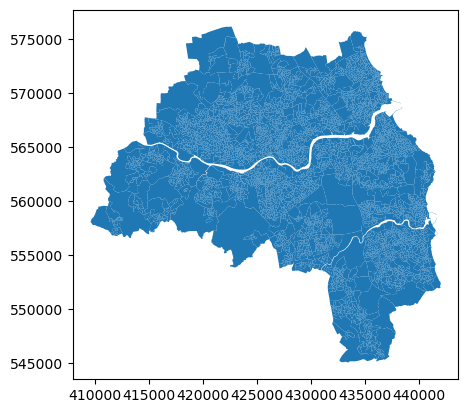

In [155]:
oa_aoi.plot()

In [158]:
oa_aoi.to_file(f"{data_folder}/processed/OA_TyneWear.gpkg")

## Air Quality

In [159]:
air = gpd.read_file(f"{data_folder}/processed/air_quality/air_quality_grid_2021.gpkg")

In [160]:
air.crs == oa_aoi.crs

True

In [161]:
interp = tobler.area_weighted.area_interpolate(air, oa_aoi, intensive_variables=["aqi"])

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: aqi, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")


<AxesSubplot: >

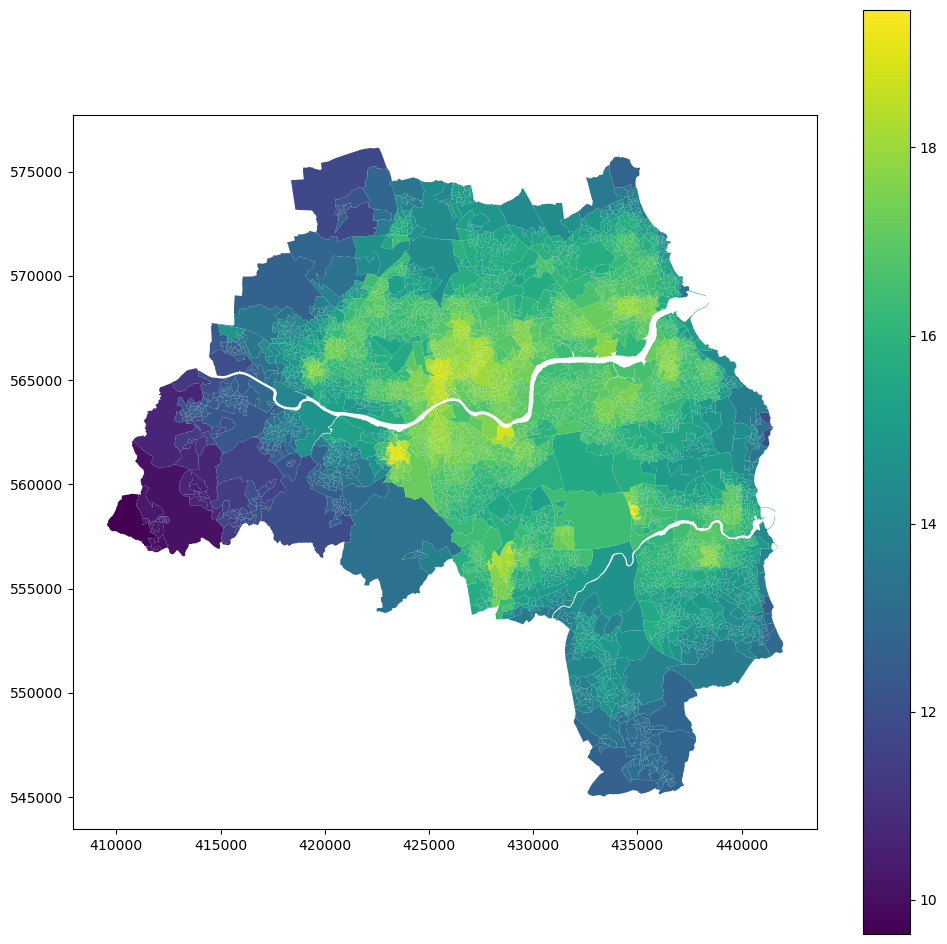

In [162]:
interp.plot('aqi', figsize=(12, 12), legend=True)

In [163]:
oa_aoi["air_quality_index"] = interp.aqi.values

## House prices

In [164]:
house_price = gpd.read_file(f"{data_folder}/processed/house_prices/price_per_sqm.gpkg")

In [165]:
oa_aoi = oa_aoi.merge(house_price[["geo_code", "priceper"]], on="geo_code", how="left")

<AxesSubplot: >

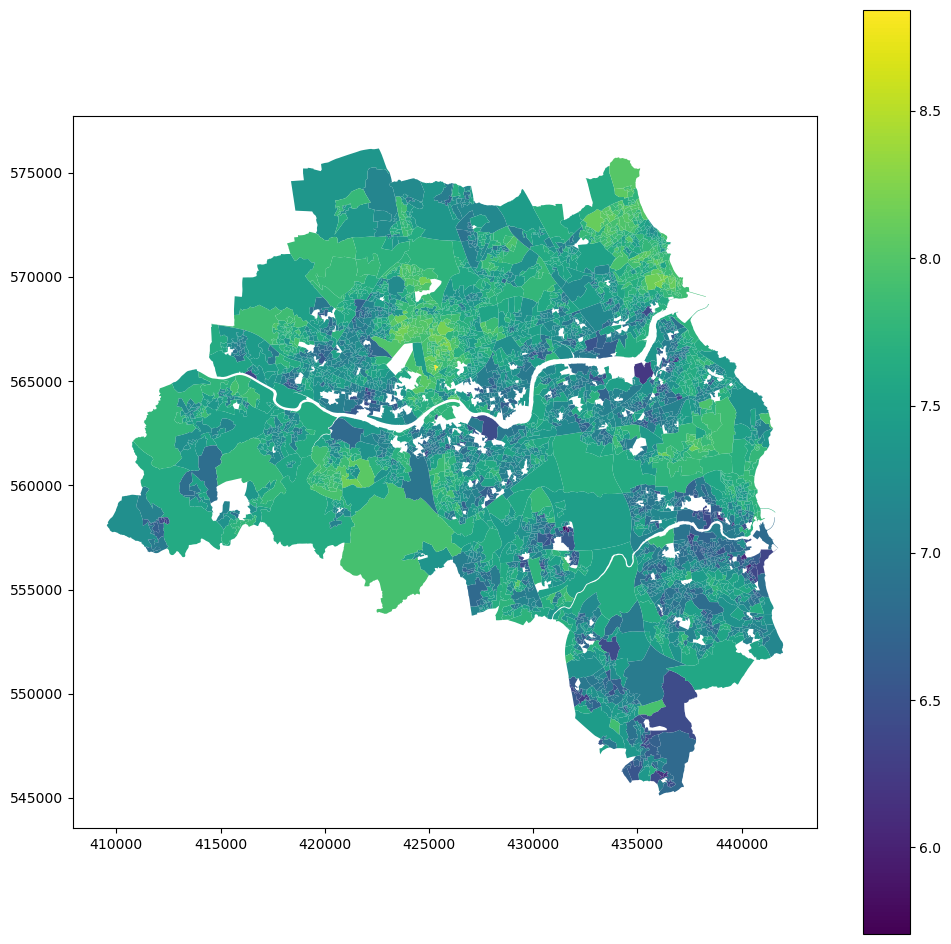

In [166]:
oa_aoi.plot(np.log(oa_aoi["priceper"]), figsize=(12, 12), legend=True)

Question: We need to figure out what to do with OAs that do not have any house price data. I would probably drop them before the training of ML. Interpolation may be tricky as we don't know the exact reasons for their missingness (may be mostly parks...). We can also try to load older data there but given the dynamics of house pricing, that may cause more trouble than good.

## Explanatory variables

### Population estimates

In [43]:
pop = pd.read_excel(
    pooch.retrieve(url="https://www.ons.gov.uk/file?uri=/peoplepopulationandcommunity/populationandmigration/populationestimates/datasets/censusoutputareaestimatesinthenortheastregionofengland/mid2020sape23dt10d/sape23dt10dmid2020coaunformattedsyoaestimatesnortheast.xlsx",
    known_hash=None),
    sheet_name="Mid-2020 Persons",
    skiprows=4
)

In [167]:
oa_aoi = oa_aoi.merge(pop[["OA11CD", "All Ages"]], left_on="geo_code", right_on="OA11CD", how="left")

<AxesSubplot: >

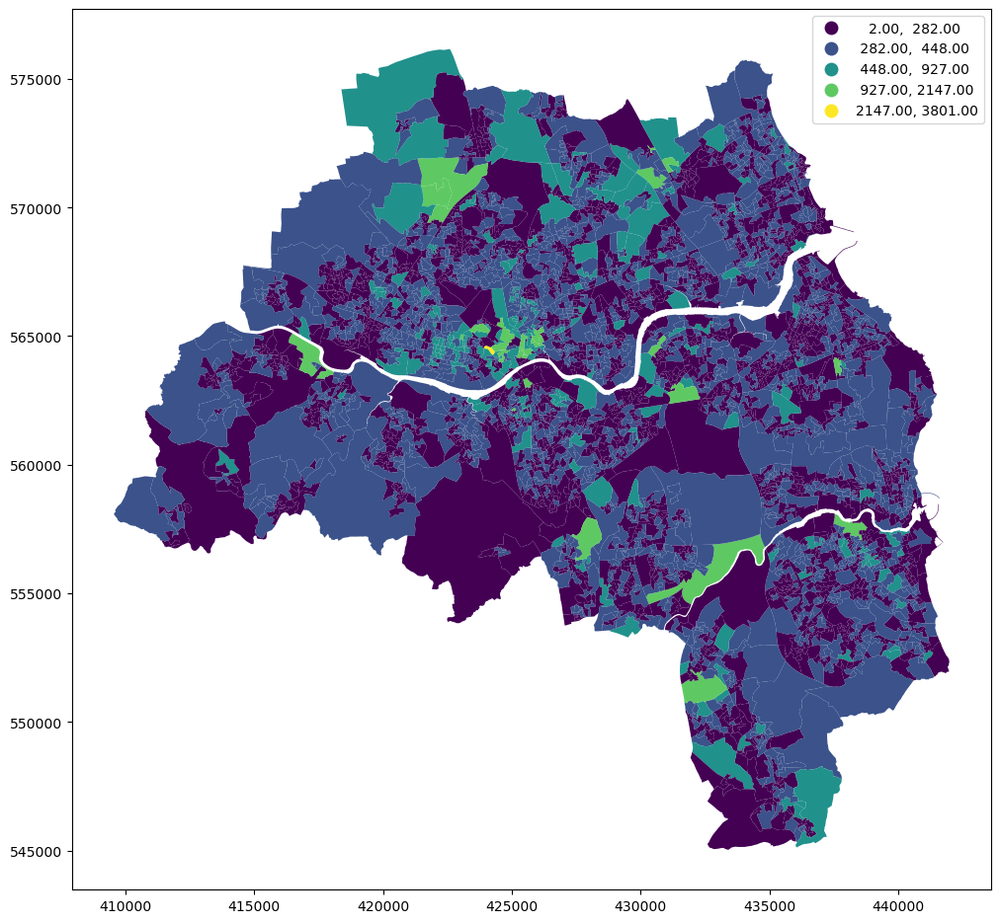

In [168]:
oa_aoi.plot("All Ages", figsize=(12, 12), legend=True, scheme='naturalbreaks')

Question: Given the OA is designed to contain the same number of people, does it make sense to use raw population estimates as an explanatory variable?

<AxesSubplot: ylabel='Frequency'>

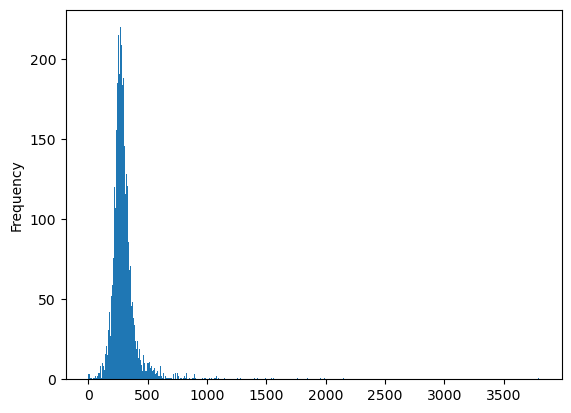

In [169]:
oa_aoi["All Ages"].plot.hist(bins=500)

### Workplace population

In [170]:
wp = gpd.read_parquet(f"{data_folder}/raw/workplace_population/workplace_by_industry_gb.pq")

In [171]:
aoi_ix, wp_ix = wp.sindex.query_bulk(aoi.geometry, predicate="intersects")

In [172]:
wp_tyne = wp.iloc[np.unique(wp_ix)]

<AxesSubplot: >

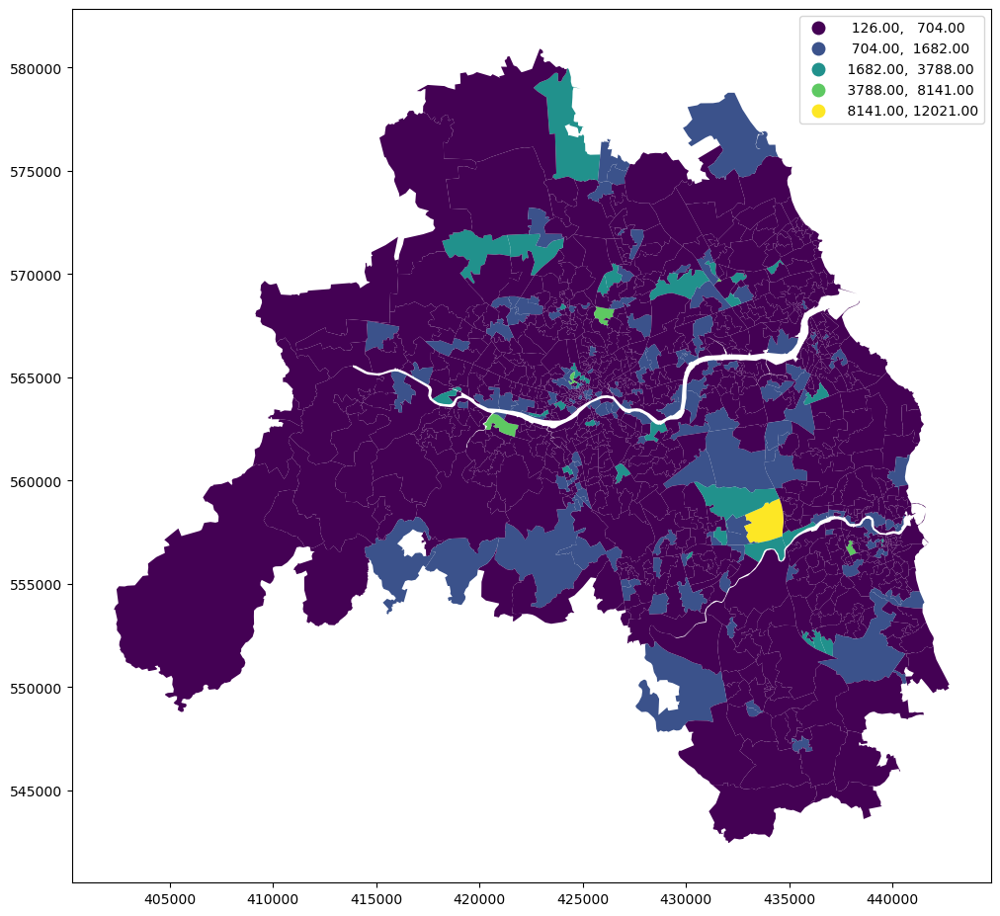

In [173]:
wp_tyne.plot(wp_tyne.sum(axis=1, numeric_only=True), figsize=(12, 12), legend=True, scheme='naturalbreaks')

In [174]:
wp_interpolated = tobler.area_weighted.area_interpolate(wp_tyne, oa_aoi, extensive_variables=[
    'A, B, D, E. Agriculture, energy and water',
    'C. Manufacturing', 'F. Construction',
    'G, I. Distribution, hotels and restaurants',
    'H, J. Transport and communication',
    'K, L, M, N. Financial, real estate, professional and administrative activities',
    'O,P,Q. Public administration, education and health',
    'R, S, T, U. Other'
])

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


In [175]:
oa_aoi[[
    'A, B, D, E. Agriculture, energy and water',
    'C. Manufacturing', 'F. Construction',
    'G, I. Distribution, hotels and restaurants',
    'H, J. Transport and communication',
    'K, L, M, N. Financial, real estate, professional and administrative activities',
    'O,P,Q. Public administration, education and health',
    'R, S, T, U. Other'
]] = wp_interpolated.drop(columns="geometry").values

### Land cover (CORINE)

In [90]:
corine = gpd.read_parquet(f"{data_folder}/raw/land_cover/corine_gb.pq")

In [176]:
aoi_ix, corine_ix = corine.sindex.query_bulk(aoi.geometry, predicate="intersects")

In [177]:
corine_tyne = corine.iloc[np.unique(corine_ix)]

In [178]:
corine_tyne

,Code_18,Remark,Area_Ha,ID,geometry
25076,211,None,3.737693e+06,EU_1626167,"MULTIPOLYGON (((429849.015 550995.684, 429820...."
29634,112,None,6.417746e+02,EU_1575384,"MULTIPOLYGON (((433438.360 551877.479, 433320...."
29637,231,None,1.339778e+02,EU_1599818,"MULTIPOLYGON (((438453.598 550001.549, 438440...."
29641,112,None,1.476355e+02,EU_1575380,"MULTIPOLYGON (((431680.159 550770.834, 431626...."
29644,112,None,6.216857e+01,EU_1575356,"MULTIPOLYGON (((438205.912 545344.397, 438181...."
...,...,...,...,...,...
41999,231,None,1.713639e+02,EU_1599848,"MULTIPOLYGON (((424940.425 556506.245, 424596...."
42000,211,None,7.403824e+01,EU_1590082,"MULTIPOLYGON (((422025.819 555141.890, 421984...."
42003,231,None,6.616719e+01,EU_1599843,"MULTIPOLYGON (((422644.228 555279.640, 422718...."
42008,321,None,3.995486e+01,EU_1616179,"MULTIPOLYGON (((425601.076 556650.981, 425531...."


In [179]:
corine_interpolated = tobler.area_weighted.area_interpolate(corine_tyne, oa_aoi, categorical_variables=["Code_18"])

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


<AxesSubplot: >

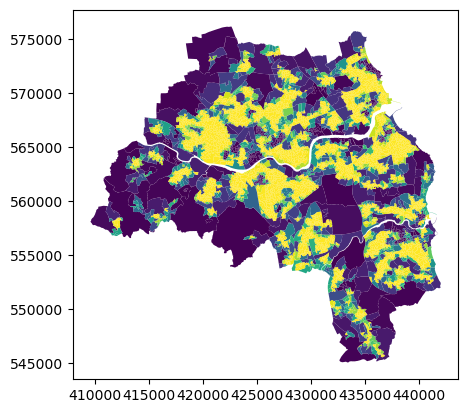

In [180]:
corine_interpolated.plot("Code_18_112")

In [181]:
corine_names = {
    'Code_18_124': 'Land cover [Airports]',
    'Code_18_211': 'Land cover [Non-irrigated arable land]',
    'Code_18_121': 'Land cover [Industrial or commercial units]',
    'Code_18_421': 'Land cover [Salt marshes]',
    'Code_18_522': 'Land cover [Estuaries]',
    'Code_18_142': 'Land cover [Sport and leisure facilities]',
    'Code_18_141': 'Land cover [Green urban areas]',
    'Code_18_112': 'Land cover [Discontinuous urban fabric]',
    'Code_18_231': 'Land cover [Pastures]',
    'Code_18_311': 'Land cover [Broad-leaved forest]',
    'Code_18_131': 'Land cover [Mineral extraction sites]',
    'Code_18_123': 'Land cover [Port areas]',
    'Code_18_122': 'Land cover [Road and rail networks and associated land]',
    'Code_18_512': 'Land cover [Water bodies]',
    'Code_18_243': 'Land cover [Land principally occupied by agriculture, with significant areas of natural vegetation]',
    'Code_18_313': 'Land cover [Mixed forest]',
    'Code_18_412': 'Land cover [Peat bogs]',
    'Code_18_321': 'Land cover [Natural grasslands]',
    'Code_18_322': 'Land cover [Moors and heathland]',
    'Code_18_324': 'Land cover [Transitional woodland-shrub]',
    'Code_18_111': 'Land cover [Continuous urban fabric]',
    'Code_18_423': 'Land cover [Intertidal flats]',
    'Code_18_523': 'Land cover [Sea and ocean]',
    'Code_18_312': 'Land cover [Coniferous forest]',
    'Code_18_133': 'Land cover [Construction sites]',
    'Code_18_333': 'Land cover [Sparsely vegetated areas]',
    'Code_18_332': 'Land cover [Bare rocks]',
    'Code_18_411': 'Land cover [Inland marshes]',
    'Code_18_132': 'Land cover [Dump sites]',
    'Code_18_222': 'Land cover [Fruit trees and berry plantations]',
    'Code_18_242': 'Land cover [Complex cultivation patterns]',
    'Code_18_331': 'Land cover [Beaches, dunes, sands]',
    'Code_18_511': 'Land cover [Water courses]',
    'Code_18_334': 'Land cover [Burnt areas]',
    'Code_18_244': 'Land cover [Agro-forestry areas]',
    'Code_18_521': 'Land cover [Coastal lagoons]',
}

In [182]:
corine_interpolated.columns = corine_interpolated.columns.map(corine_names)

In [183]:
interesting = [
    "Land cover [Discontinuous urban fabric]",
    "Land cover [Continuous urban fabric]",
    "Land cover [Non-irrigated arable land]",
    "Land cover [Industrial or commercial units]",
    "Land cover [Green urban areas]",
    "Land cover [Pastures]",
    "Land cover [Sport and leisure facilities]",
]
oa_aoi[interesting] = corine_interpolated[interesting].values

### Job Accessibility

In [290]:
jobs = pd.read_csv(f"{data_folder}/processed/accessibility/results/acc_jobs15_OAs_tynewear.csv",index_col=0)
jobs.head()

,from_id,A_jobs_cum_15
0,E00041363,1065
1,E00041364,1425
2,E00041366,900
3,E00041367,1115
4,E00041368,290


In [292]:
oa_aoi = oa_aoi.merge(jobs, left_on="geo_code", right_on="from_id", how="left")

### Urban morphometrics

In [114]:
chunks = gpd.read_parquet(f"{data_folder}/raw/urban_morpho/local_auth_chunks.pq")

In [117]:
m = chunks[chunks.intersects(aoi.unary_union)].explore()
aoi.explore(m=m, color="red")

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


In [118]:
cells =  gpd.read_parquet(f"{data_folder}/raw/urban_morpho/cells_26.pq")

In [122]:
chars = cells.columns.drop(["hindex", "tessellation", "buildings", "nodeID", 'edgeID_keys', 'edgeID_values', 'edgeID_primary'])

In [184]:
morhp_interpolated = tobler.area_weighted.area_interpolate(cells, oa_aoi, intensive_variables=chars.tolist())

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: sdbAre, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: sdbPer, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: sdbCoA, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/tobler/util/util.py:32: UserWarning: nan values in variable: ssbCCo, replacing with 0

In [185]:
oa_aoi[morhp_interpolated.columns.drop("geometry")] = morhp_interpolated.drop(columns='geometry').values

In [187]:
oa_aoi = oa_aoi.drop(columns="OA11CD").rename(columns={"priceper": "house_price_index", "All Ages": "population_estimate", "A_jobs_cum_15": "jobs_accessibility_index"})

In [297]:
oa_aoi.to_parquet(f"{data_folder}/processed/interpolated/all_oa.parquet")

## Maps

In [317]:
import contextily 
from legendgram import legendgram
import palettable.matplotlib as palmpl
from palettable.palette import Palette
import matplotlib.pyplot as plt
import mapclassify
from matplotlib.colors import Colormap
import husl
import seaborn as sns

In [319]:
def legendgram(f, ax, y, breaks, pal, bins=50, clip=None,
               loc = 'lower left', legend_size=(.27,.2),
               frameon=False, tick_params = None):
    '''
    Add a histogram in a choropleth with colors aligned with map
    ...
    Arguments
    ---------
    f           : Figure
    ax          : AxesSubplot
    y           : ndarray/Series
                  Values to map
    breaks      : list
                  Sequence with breaks for each class (i.e. boundary values
                  for colors)
    pal         : palettable colormap or matplotlib colormap
    clip        : tuple
                  [Optional. Default=None] If a tuple, clips the X
                  axis of the histogram to the bounds provided.
    loc         :   string or int
                    valid legend location like that used in matplotlib.pyplot.legend
    legend_size : tuple
                  tuple of floats between 0 and 1 describing the (width,height)
                  of the legend relative to the original frame.
    frameon     : bool (default: False)
                  whether to add a frame to the legendgram
    tick_params : keyword dictionary
                  options to control how the histogram axis gets ticked/labelled.
    Returns
    -------
    axis containing the legendgram.
    '''
    k = len(breaks)
    histpos = make_location(ax, loc, legend_size=legend_size)
    histax = f.add_axes(histpos)
    N, bins, patches = histax.hist(y, bins=bins, color='0.1')
    #---
    if isinstance(pal, Palette):
        pl = pal.get_mpl_colormap()
    elif isinstance(pal, Colormap):
        pl = pal
    else:
        raise ValueError("pal needs to be either palettable colormap or matplotlib colormap, got {}".format(type(pal)))
    bucket_breaks = [0]+[np.searchsorted(bins, i) for i in breaks]
    for c in range(k):
        for b in range(bucket_breaks[c], bucket_breaks[c+1]):
            patches[b].set_facecolor(pl(c/k))
    #---
    if clip is not None:
        histax.set_xlim(*clip)
    histax.set_frame_on(frameon)
    histax.get_yaxis().set_visible(False)
    if tick_params is None:
        tick_params = dict()
    tick_params['labelsize'] = tick_params.get('labelsize', 12)
    histax.tick_params(**tick_params)
    return histax

def make_location(ax,loc, legend_size=(.27,.2)):
    """
    Construct the location bounds of a legendgram
    Arguments:
    ----------
    ax          :   matplotlib.AxesSubplot
                    axis on which to add a legendgram
    loc         :   string or int
                    valid legend location like that used in matplotlib.pyplot.legend
    legend_size :   tuple or float
                    tuple denoting the length/width of the legendgram in terms
                    of a fraction of the axis. If a float, the legend is assumed
                    square. 
    Returns
    -------
    a list [left_anchor, bottom_anchor, width, height] in terms of plot units
    that defines the location and extent of the legendgram.
    """
    position = ax.get_position()
    if isinstance(legend_size, float):
        legend_size = (legend_size, legend_size)
    lw, lh = legend_size
    legend_width = position.width * lw
    legend_height = position.height * lh
    right_offset = (position.width - legend_width)
    top_offset = (position.height - legend_height)
    anchor_x, anchor_y = position.x0+.035, position.y0 + .04
    return [anchor_x, anchor_y, legend_width, legend_height]

#### Air Quality

In [351]:
from shapely.geometry import box

bds = oa_aoi.total_bounds
extent = gpd.GeoSeries([box((bds[0] - 7000), bds[1], bds[2] + 7000, bds[3])], crs=oa_aoi.crs).to_crs(3857)

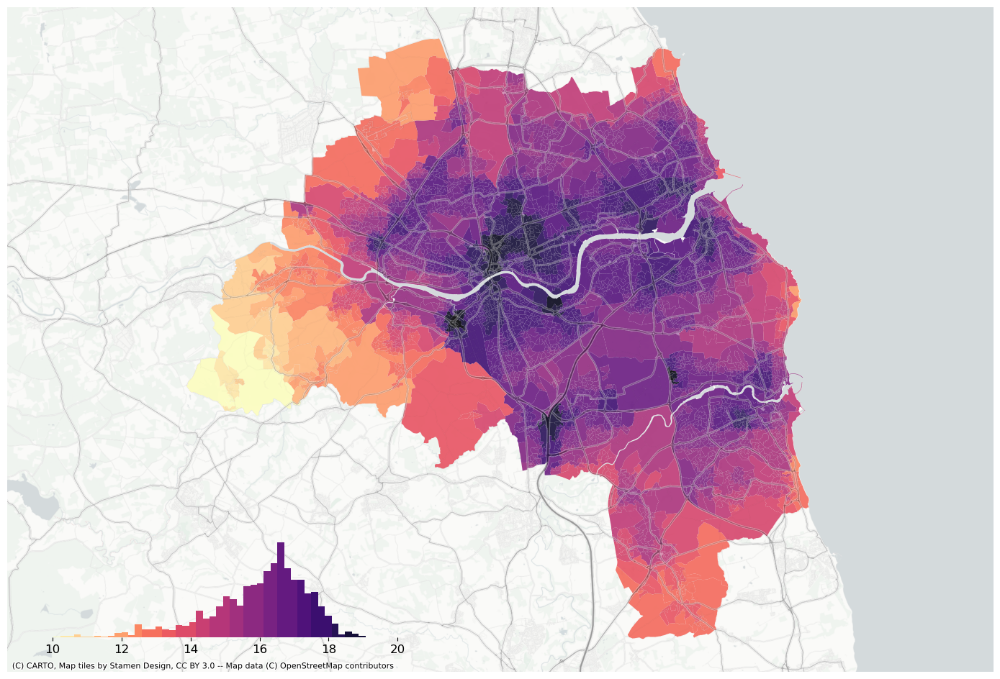

In [352]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
oa_aoi.to_crs(3857).plot("air_quality_index", scheme="equalinterval", k=20, ax=ax, alpha=.9, cmap="magma_r")
bins = mapclassify.EqualInterval(oa_aoi['air_quality_index'].values, k=20).bins
legendgram(
    f,
    ax,
    oa_aoi['air_quality_index'],
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (10,20), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
plt.savefig("../output/figs/air_quality_index.png", dpi=150, bbox_inches="tight")


#### House price

Filling NAs just for plotting purposes.

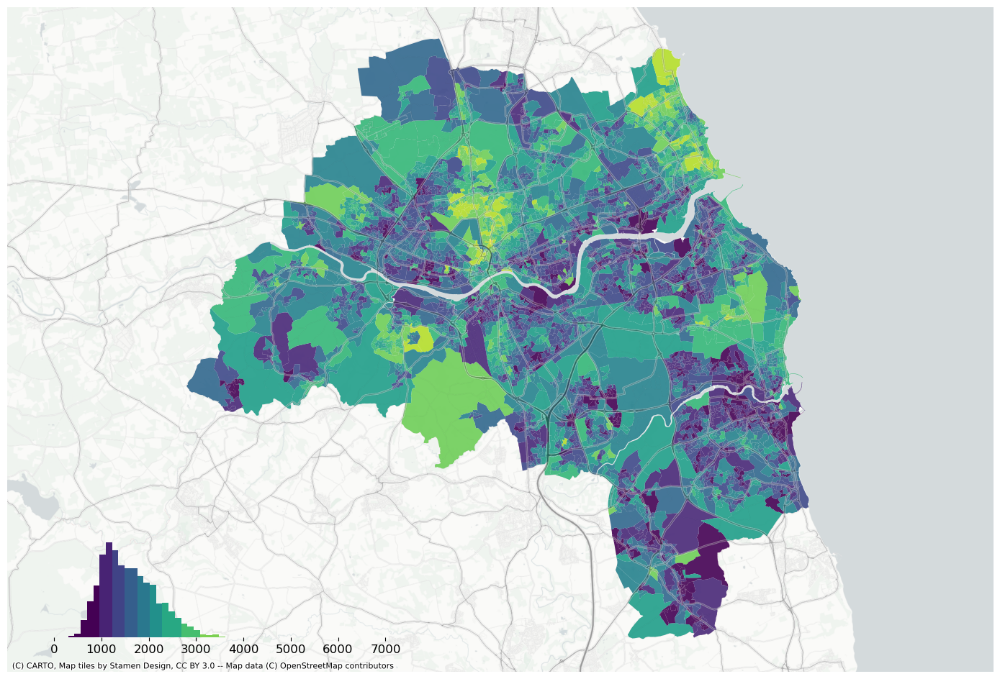

In [354]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
oa_aoi.to_crs(3857).plot(oa_aoi["house_price_index"].fillna(method="pad"), scheme="naturalbreaks", k=10, ax=ax, alpha=.9, cmap="viridis")
bins = mapclassify.NaturalBreaks(oa_aoi["house_price_index"].dropna().values, k=10).bins
legendgram(
    f,
    ax,
    oa_aoi["house_price_index"].dropna(),
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    # clip = (10,20), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
plt.savefig("../output/figs/house_price_index.png", dpi=150, bbox_inches="tight")

#### Jobs accessibility

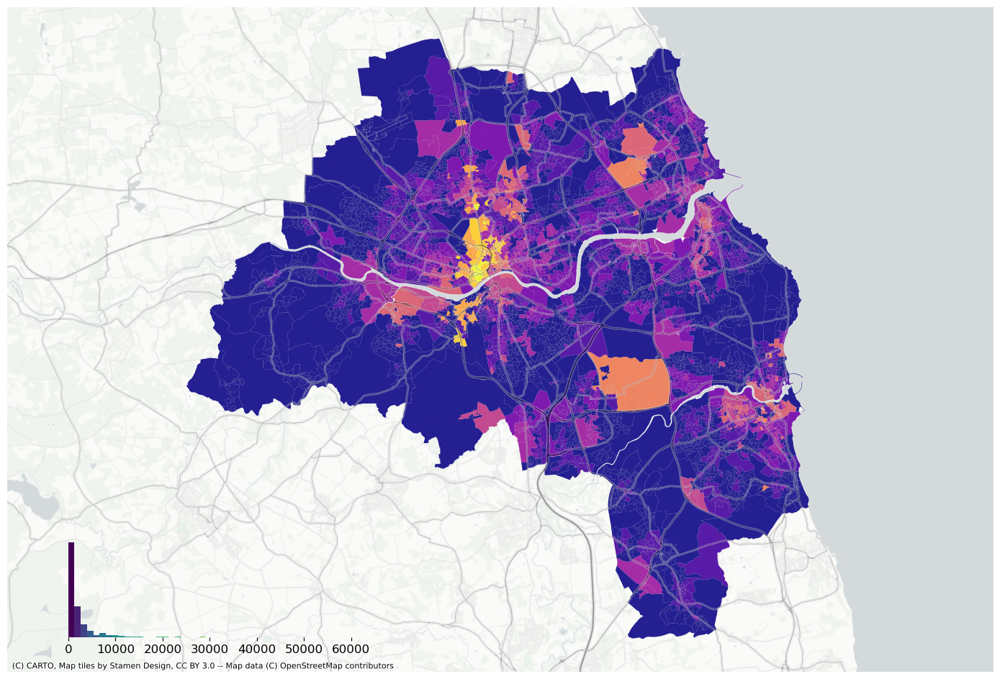

In [355]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
oa_aoi.to_crs(3857).plot(oa_aoi["jobs_accessibility_index"].fillna(method="pad"), scheme="naturalbreaks", k=10, ax=ax, alpha=.9, cmap="plasma")
bins = mapclassify.NaturalBreaks(oa_aoi["jobs_accessibility_index"].dropna().values, k=10).bins
legendgram(
    f,
    ax,
    oa_aoi["jobs_accessibility_index"].dropna(),
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    # clip = (10,20), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
plt.savefig("../output/figs/jobs_accessibility_index.png", dpi=150, bbox_inches="tight")

In [357]:
for char in oa_aoi.columns.drop(["geometry", "geo_code", "air_quality_index", "house_price_index", "jobs_accessibility_index"]):
   values = oa_aoi[char]


   gdf = oa_aoi.to_crs(3857)
   hue = np.random.randint(0, 360, 1)[0]
   k=10  # number of classes
   clip=None  #clip=(0, 100)  # in case of long tail
   mc=mapclassify.NaturalBreaks(values, k=k).bins  # classification scheme
   bins = 50  # resolution of histogram


   # plotting
   color = (hue, 75, 35)
   c = husl.husl_to_hex(*color)
   cmap = sns.light_palette(color, input="husl", as_cmap=True, n_colors=k)

   ax = gdf.plot(values, cmap=cmap, figsize=(18, 12), scheme='UserDefined', k=k, classification_kwds=dict(bins=mc))
   extent.plot(ax=ax, alpha=0)
   ax.set_axis_off()

   # add legend
   hax = legendgram(plt.gcf(), # grab the figure, we need it
            ax, # the axis to add the legend
            values, # the attribute to map
            mc,
            cmap, # the palette to use
            legend_size=(.35,.15),
            loc=4,
         #    tick_params={'color':c, 'labelcolor':c,'labelsize':10},
            clip=clip,
            bins=bins,
            )  # when usign legendgram, dev version from mpl_cmap branch should be used
   contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
   contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
   plt.savefig(f"../output/figs/ex_var_{char}.png", dpi=150, bbox_inches="tight")
   plt.close()

154